#  Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  
* Нужно подготовить исследование рынка Москвы, найти интересные особенности  
* Презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места  
Данные с которыми будем работать заведения общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года


ССЫЛКА НА ПРЕЗЕНТАЦИЮ https://disk.yandex.ru/i/JJfeW5Hdo4goiQ

* Описание данных  
Файл moscow_places.csv:  
name — название заведения;  
address — адрес заведения;  
category — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
hours — информация о днях и часах работы;  
lat — широта географической точки, в которой находится заведение;  
lng — долгота географической точки, в которой находится заведение;  
rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
    
* «Средний счёт: 1000–1500 ₽»;  
«Цена чашки капучино: 130–220 ₽»;  
«Цена бокала пива: 400–600 ₽».  
и так далее;  
middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
    
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
0 — заведение не является сетевым  
1 — заведение является сетевым  
district — административный район, в котором находится заведение, например Центральный административный округ;  
seats — количество посадочных мест.  

# Знакомстово с данными

In [5]:
!pip install cufflinks plotly

In [6]:
!pip install plotly

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
pd.set_option('display.max_columns', 0)
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl', offline=True)
import requests
import json

url = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
response = requests.get(url)
geo_json = json.loads(response.text)



In [8]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
   data = pd.read_csv('moscow_places.csv')
#путь  

In [9]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


* Всего заведений 8406 но есть сетевые рестораны так что уникальных будет меньше  
* Всего 14 столбцов в формате object,float64,int64 есть пропуски в hours,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats  


In [11]:
print('Количество заведений:',data['name'].nunique())

Количество заведений: 5614


Уникальных заведений 5614

In [12]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [13]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data['avg_bill'] = data['avg_bill'].str.lower()

Приведем данные к нижнему регистру 

In [14]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


## Выводы
* Всего в датасете 8406 значений 
* Есть пропуски 
* Уникальных заведений 5614

# Предобработка данных


Изучим, есть ли дубликаты в данных. Посмотрим пропуски.


In [15]:
print(f'Кол-во дубликатов {data.duplicated().sum()}')

Кол-во дубликатов 0


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [17]:
data.isna()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,False,False,False,False,False,False,False,False,True,True,True,True,False,True
1,False,False,False,False,False,False,False,False,False,False,False,True,False,False
2,False,False,False,False,False,False,False,False,False,False,False,True,False,False
3,False,False,False,False,False,False,False,False,True,False,True,False,False,True
4,False,False,False,False,False,False,False,False,False,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,False,False,False,False,False,False,False,False,True,True,True,True,False,False
8402,False,False,False,False,False,False,False,False,True,True,True,True,False,False
8403,False,False,False,False,False,False,False,False,True,False,False,True,False,False
8404,False,False,False,False,False,False,False,False,True,True,True,True,False,False


In [18]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Есть пропуски в hours,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats

In [19]:
data[data.isnull().any(axis=1)]
#Посмотрим пропуски 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Адекватно заполнить пропуски мы не можем мода и медиана не подойдут для не сетевых заведений, в сетевых возмжно заполнить по моде, пока оставим как есть, возможно заполним маркерными значениями 

In [20]:
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория',
         'квартал','просек','парк','мост'] # список слов префиксов
 
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words)) #регулярное выражение кторороищет сроку которая начинается с любого символа
 
data['street'] = data['address'].str.extract(str_pat, flags=re.I)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


```python
data['address'].str.split(', ').str[1]
```

In [21]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица


In [22]:
data['hours'] = data['hours'].astype(str)

In [23]:
data['is_24/7'] = data['hours'].apply(lambda x: True if re.search(r'ежедневно,\s*24/7|круглосуточно', x) else False)

```python
data['hours'].str.contains('ежедневно, круглосуточно')

```

Добавим данные о том что заведение работает круглосуточно с помощью регулярного выражения 

In [24]:
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


## Выводы  
* Извлекли улицу из адреса и добавили ее в столбец street  
* Так же добавили столбец is_24/7 с маркером работает ли заведение круглосуточно 

# Анализ данных

## Исследуем какие категории есть в датасете 

In [25]:
# Сгруппируем данные по столбцу 'category'
grouped_data = data.groupby('category')

# Сосчитаем количество объектов в каждой группе
counts = grouped_data.size()

In [26]:
counts.sort_values(ascending=False)

category
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
dtype: int64

In [27]:
colors = ['red', 'green', 'blue', 'yellow', 'orange','purple','pink']
fig = go.Figure(data=[go.Bar(x=counts.index, y=counts.values, marker=dict(color=colors), text=counts.values, textposition='auto',)])
fig.update_layout(
    title='Распределение по категориям',
    xaxis_title='Категории',yaxis_title='Количество объектов')
    #yaxis={'categoryorder':'total ascending'})

In [28]:
fig = px.pie(values=counts.values, names=counts.index, title='Распределение объектов общественного питания по категориям')
fig.show()

* В данных болше всего заведений по типу  
* Кафе 2378  
* Ресторан 2043  
* Кофейни 1413  
Кафе состовляют 28% Рестороны 24% Кофейни 16%  
Остальные 32% это Бары,пабы Пиццерии Быстрое питание столовые и булочные 

## Исследуем кол-во посадочных мест 

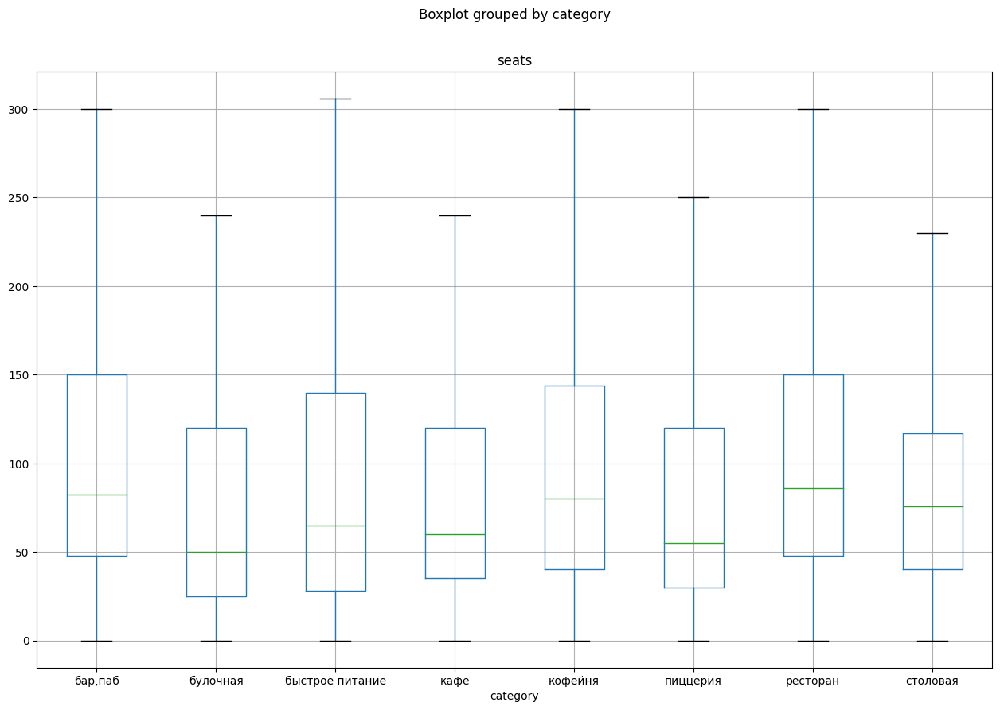

In [29]:
data.boxplot(column='seats', by='category', figsize=(15, 10),showfliers=False)
plt.show()

In [30]:
fig = px.box(data, x='category', y='seats')
fig.update_layout(title="Ящик с усами по кл-во мест ",
                  xaxis_title="Тип заведения",
                  yaxis_title="Кол-во посадочных мест")
fig.show()

Очень похоже что кол-во посадочных мест больше 600 выброс, возможно при выгурзке даных лишняя 8 т.к она встречается 5 раз в разных категориях а где то лишний 0, уберем выбросы

In [31]:
print('Заведений с числом мест больше 600:', data[data['seats'] > 600]['name'].count())

Заведений с числом мест больше 600: 53


Таких заведений меньше 1%, удалим их.

In [32]:
df600 = data[data['seats'] > 600]
data = data.query('index not in @df600.index')
print('Заведений с числом мест больше 600:', data[data['seats'] > 600]['name'].count())

Заведений с числом мест больше 600: 0


In [33]:
#mean_seats_by_category = data.groupby('category')['seats'].mean().round()
#mean_seats_by_category

In [34]:
mean_seats_by_category = data.groupby('category')['seats'].mean().reset_index().round().sort_values(by='seats',ascending=False)
#собираем данные для построени графика по срднему кол-ву мест по категориям 

In [35]:

fig = go.Figure(data=[
    go.Bar(name='Категория', x=mean_seats_by_category['category'], y=mean_seats_by_category['seats'],marker=dict(
        color=['red', 'blue', 'green', 'yellow','coral','lime','teal','cyan']))])

fig.update_layout(title="Среднее кол-во мест по категориям",
                  xaxis_title="Тип заведения",
                  yaxis_title="Кол-во посадочных мест")

fig.show()

In [36]:
median_seats_by_category = data.groupby('category')['seats'].median().reset_index().round().sort_values(
    by='seats',ascending=False)
#собираем данные для построени графика по медианому кол-ву мест по категориям 

In [37]:

fig = go.Figure(data=[
    go.Bar(name='Категория', x=median_seats_by_category['category'], y=mean_seats_by_category['seats'],marker=dict(
        color=['red', 'blue', 'green', 'yellow','coral','lime','teal','cyan']))])

fig.update_layout(title="Медианное кол-во мест по категориям",
                  xaxis_title="Тип заведения",
                  yaxis_title="Кол-во посадочных мест")

fig.show()

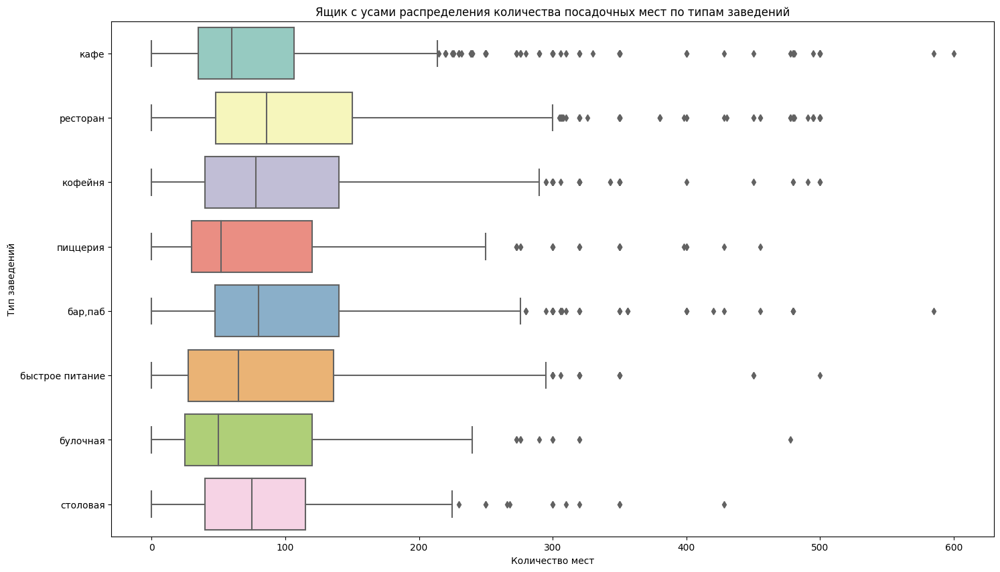

In [38]:
plt.figure(figsize=(17, 10))
ax = sns.boxplot(data=data, x='seats', y='category', palette="Set3")
plt.title('Ящик с усами распределения количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.show()

**Выводы**
* Больше всего мест в ресторанах 86 по медиане и 115 по среднему  
* Дальше идут кофйни и бары с примерно одинаковым кол-вом по среднему от 100-110 и по медина от 78- 80  
* У кафе столовых и пиццерий меньше всего мест 

## Соотношение сетевых и несетевых заведений

In [39]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain
# считаем сетевые заведения 

,chain,count
0,0,5174
1,1,3179


In [40]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

**Большинство заведений не сетевые почти 62%**

<Figure size 2000x800 with 0 Axes>

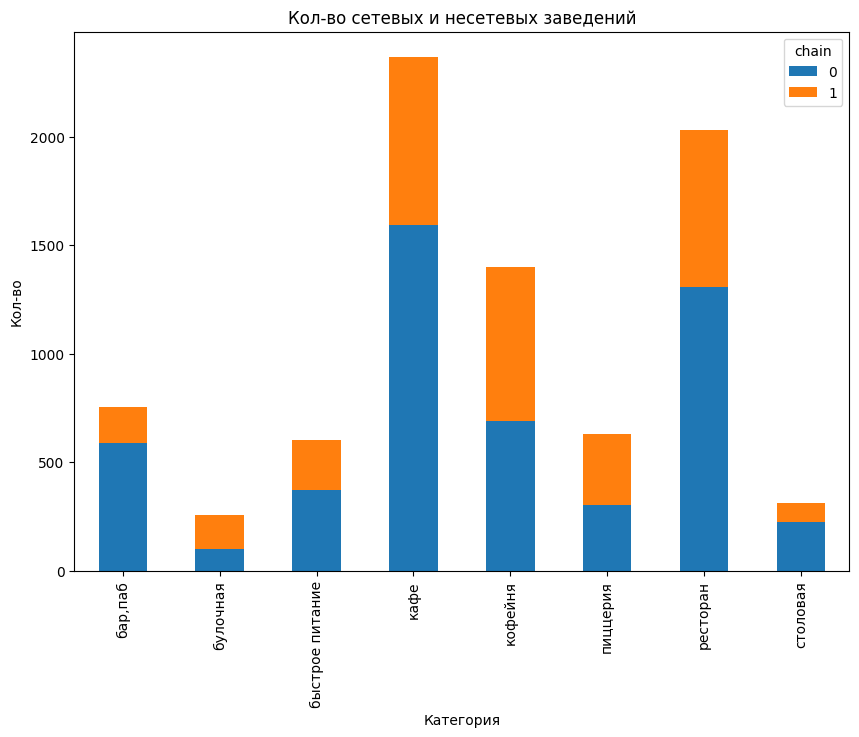

In [41]:
chain_counts = data.groupby(['chain', 'category']).size().reset_index(name='counts')
chain_pivot = chain_counts.pivot(index='category', columns='chain', values='counts')
plt.rcParams ['figure.figsize'] = [10, 7]
plt.figure(figsize=(20,8))
chain_pivot.plot.bar(stacked=True)
plt.xlabel('Категория')
plt.ylabel('Кол-во')
plt.title('Кол-во сетевых и несетевых заведений')
plt.show()

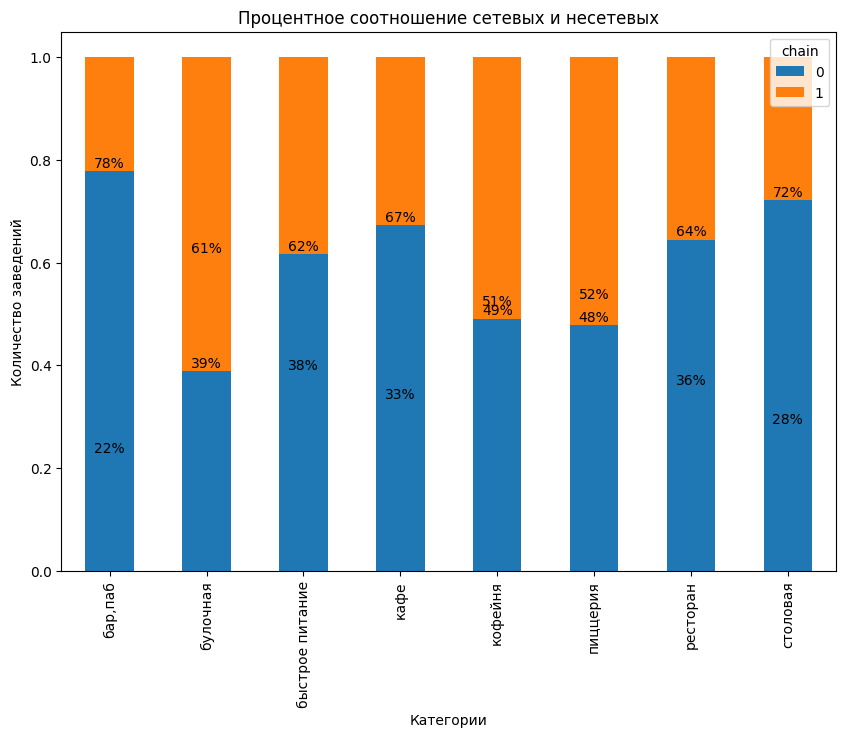

In [42]:
chain_pivot = chain_pivot.div(chain_pivot.sum(axis=1), axis=0)
chain_pivot.plot.bar(stacked=True)
plt.xlabel('Категории')
plt.ylabel('Проценты')
plt.title('Процентное соотношение сетевых и несетевых')
for p in ax.patches:
    ax.annotate(f"{p.get_height()*100:.0f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11, color='black', rotation=90,
                 xytext=(0, 10), textcoords='offset points')
for i in range(len(chain_pivot)):
    for j in range(len(chain_pivot.columns)):
        percent = chain_pivot.iloc[i, j]
        plt.annotate(f'{percent:.0%}', xy=(i, percent), xytext=(0,3), textcoords="offset points", ha='center')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.show()

**Выводы**  
* Чаще всего заведения не сетевые   
* Среди сетевых в основном сетевыми бывают кофйни и пиццерии а так же неожидано булочные 

## Топ 15

In [43]:
df_chain = data[data['chain'] == 1]
top_15 = df_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,118
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,70
4,яндекс лавка,4.00,ресторан,68
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,кулинарная лавка братьев караваевых,4.40,кафе,38


Text(0.5, 1.0, 'График распределения категорий заведений в топ 15 ')

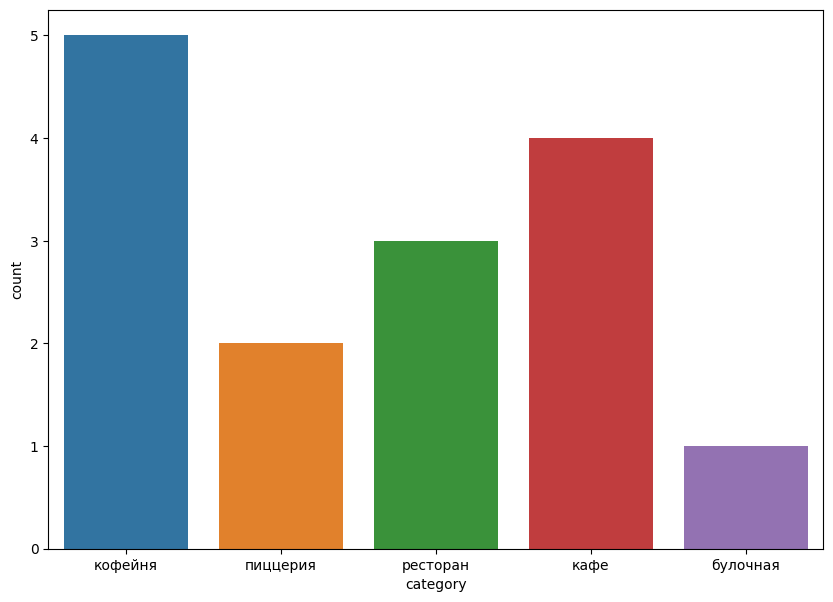

In [44]:
sns.countplot(x='category', data=top_15, )
ax.set_title('График распределения категорий заведений в топ 15 ')

In [45]:
fig = px.bar(top_15, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count', # добавляем аргумент, который отобразит текст с информацией
             color='name'                   # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False)
fig.show() 

**Вывод**  
Самое популярное заведение Шоколадница и известные пицерии 
Самая пупулярная категория Кофейни 

## Административные районы

In [46]:
district_category = data.pivot_table(values='name', index='district', columns='category', aggfunc='count')
#district_category['total'] = district_category.sum(axis=1)
#district_category['кафе_percent'] = (district_category['кафе'] / district_category['total']) * 100
#district_category['ресторан_percent'] = (district_category['ресторан'] / district_category['total']) * 100


In [47]:
fig = px.bar(district_category, orientation='h', color='category')
fig.update_layout(title='Распределение заведений по категориям и районам',
                 xaxis_title='Количество заведений',
                 yaxis_title='Районы',
                 yaxis={'categoryorder':'total ascending'},
                 legend_title='Категории')
fig.show()


In [48]:
print(f'Административные районы Москвы в датасете: {len(data["district"].unique())}')
print()
print(data['district'].unique())

Административные районы Москвы в датасете: 9

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


* Больше всего заведений в центральном округе
* Меньше всего в северо-заподном 
* Всего у нас 9 райнов 
* Больше всего заведний категории кафе

##  Распределение средних рейтингов по категориям 

In [49]:
fig = px.box(data, x='category', y='rating', points='outliers', title='Распределение средних рейтингов по категориям')
fig.show()

In [50]:
rating_category = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values(by='rating',ascending=False).reset_index()
rating_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [51]:
fig= px.bar(rating_category,
           x='rating',
           y='category',
           text='rating',
           color='category')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
#fig.update_xaxes(range=[4, 4.5])
fig.show() # выводим график

* Самые высокие рейтинки у Баров, пиццерий,ресторанов 4.3 - по среднему  
* По медиане самые высокие рейтинги у баров 4.4  
* Саме низкие рейтинги у быстроко питания 4.0 по среднему и 4.2 по медиане 

## Фоновая картограмма со средним рейтингм 

In [52]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [53]:
# импортируем карту и хороплет
from folium import Map, Choropleth
!pip install folium
# загружаем JSON-файл с границами округов Москвы
state_geo = geo_json
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

* Самые выские рейтинги в центральном округе  
* Самые низкие в Юго-восточном и Северо-восточном

## Все заведения на карте

In [54]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

* По карте видно что основное кол-во заведений находится в центре Москвы

## Топ-15 улиц по количеству заведений

In [55]:
streets_moscow = data[data['street'].notnull()]
top15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street_name', 'count']
top15_streets
#собираем топ 15 по кол-ву заведений 

,street_name,count
0,проспект мира,184
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,75
7,ленинградский проспект,72
8,ленинградское шоссе,69
9,мкад,65


In [56]:
streets_category = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street_name', 'category', 'count']
streets_category.sort_values('count', ascending=False)
# создаем датафрейм в котором соберем значения по улица-категория и отсортруем

,street_name,category,count
2080,проспект мира,кафе,53
1499,мкад,кафе,45
2083,проспект мира,ресторан,45
2081,проспект мира,кофейня,36
2092,профсоюзная улица,кафе,35
...,...,...,...
1496,мишина улица,кофейня,1
1497,мкад,"бар,паб",1
1502,мкад,столовая,1
1506,можайское шоссе,пиццерия,1


In [57]:
streets15_category = streets_category[streets_category['street_name'].isin(top15_streets['street_name'])]
streets15_category
#оставим значения только из топ15

,street_name,category,count
692,варшавское шоссе,"бар,паб",6
693,варшавское шоссе,быстрое питание,7
694,варшавское шоссе,кафе,17
695,варшавское шоссе,кофейня,14
696,варшавское шоссе,пиццерия,4
...,...,...,...
3103,улица миклухо-маклая,быстрое питание,4
3104,улица миклухо-маклая,кафе,20
3105,улица миклухо-маклая,кофейня,4
3106,улица миклухо-маклая,пиццерия,2


In [58]:
fig = px.bar(streets15_category, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='street_name', # указываем столбец с данными для оси Y                  
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}

                 )
fig.show() 

* Больше всего заведений на проспекте Мира 
* Преобладают Кафе и рестораны 

## Одно заведение на улице 

In [59]:
one_cafe = data['street'].value_counts().reset_index()
one_cafe.columns = ['street_name', 'cafe_count']
one_cafe = one_cafe[one_cafe['cafe_count'] == 1]
one_cafe

,street_name,cafe_count
969,пушкарёв переулок,1
970,тюменский проезд,1
971,3-я фрунзенская улица,1
972,улица габричевского,1
973,иваньковское шоссе,1
...,...,...
1389,гаврикова улица,1
1390,курсовой переулок,1
1391,триумфальная площадь,1
1392,кольцевая линия,1


In [60]:
streets1_category = streets_category[streets_category['street_name'].isin(one_cafe['street_name'])]
streets1_category = streets1_category.groupby('category')['street_name'].count()
streets1_category.sort_values(ascending=False)

category
кафе               142
ресторан            90
кофейня             74
бар,паб             40
столовая            36
быстрое питание     20
пиццерия            14
булочная             9
Name: street_name, dtype: int64

* на 425 улицах только одно заведение  
* Больше всего заведений типа кафе

## Средний чек 

In [61]:
median_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [62]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

* Самый выской средний чек в центральном, западном районе  
* Самый низкий чек в южном, юго-восточном и северном районе 

## Открытие кофейни 

In [63]:
print('Всего кофейн в датасете',len(data[data['category']=='кофейня']))

Всего кофейн в датасете 1401


In [64]:
#coffee_count = data[data['category'] == 'кофейня'].shape[0]
#print(coffee_count)

In [65]:
coffee_count = data.query('category == "кофейня"')
coffee_count = coffee_count.groupby('district').agg({'name':'count'})
coffee_count = coffee_count.sort_values('name', ascending = False).reset_index()
coffee_count = coffee_count.rename(columns={'district':'count'})
coffee_count

,count,name
0,Центральный административный округ,428
1,Северный административный округ,186
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [66]:
coffe_24 = data.query('category == "кофейня"')
coffe_24['is_24/7'].value_counts()

False    1325
True       76
Name: is_24/7, dtype: int64

In [67]:
rating_coffe = data.groupby('district')['rating'].mean().round(2).reset_index()
rating_coffe

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [68]:
fig= px.bar(rating_coffe,
           x='rating',
           y='district',
           text='rating',
           color='rating')
fig.update_layout(title='Распределение средних рейтингов кофейн по районам',
                   xaxis_title='Рейтинг',
                   yaxis_title='Районы')
#fig.update_xaxes(range=[4, 4.5])
fig.show() # выводим график

In [69]:
cup_median = coffe_24.groupby('district').agg({'middle_avg_bill':'median'}).reset_index().sort_values(
    by='middle_avg_bill',ascending=False)
cup_median

,district,middle_avg_bill
1,Западный административный округ,600.0
5,Центральный административный округ,500.0
0,Восточный административный округ,400.0
8,Южный административный округ,387.5
7,Юго-Западный административный округ,375.0
2,Северный административный округ,325.0
3,Северо-Восточный административный округ,325.0
4,Северо-Западный административный округ,325.0
6,Юго-Восточный административный округ,250.0


In [70]:
fig= px.bar(cup_median,
           x='middle_avg_bill',
           y='district',
           text='middle_avg_bill',
           color='middle_avg_bill')
fig.update_layout(title='Распределение среднией стоимости кружки кофе',
                   xaxis_title='Стоимость',
                   yaxis_title='Районы')
#fig.update_xaxes(range=[4, 4.5])
fig.show() # выводим график

In [71]:

chain_0 = data[data['chain'] == 0]['rating']
chain_1 = data[data['chain'] == 1]['rating']

fig = go.Figure()
fig.add_trace(go.Box(x=chain_0, name='Non-chain'))
fig.add_trace(go.Box(x=chain_1, name='Chain'))

fig.update_layout(xaxis_title='Распределение рейтингов между сетевыми и несетевыми заведениями', yaxis_title='Рейтинг')
fig.show()

## Выводы
* Всего кофеен в датасете 1401  
* Круглосуточных кофеен 76  
* Средние рейтинги по районам от 4.1 до 4.3 самые высокие в центральном районе  
* Стоимость чашки капучино нужно рентироватся от открытия района кофейни в центральный районах это 500р в Северных в среднем 325

# Общий вывод  
Проведя анализ видно что самый частый тип заведения кафе 2366, ресторан 2031, меньше всего булочных 255 и столовых 313  
Кафе и рестораны составляют почти 52,6% от всех заведений. Кофейни, бары/пабы и пиццерии составляют 25,9% от общего числа 
Больше всего посадочный мест у рестранов и баров , у кафе пасадочных мест меньше в среднем в ресторанах 115 посадочных мест в кафе 90
В основм в Моске заведения не сетевые 61.9% заведений не имеют сети  
За исключением категорий кофейня 51% сетевые, пиццерии 52%  и булочные 61% сетевых  
Самая популярная сеть - Шоколадница, меньше всего заведенийу Му-Му  
По графику видно что больше всего  в топ 15  заведения типа кофейня  
Всего у нас 9 округов. По графику видно, что больше всего заведений по всем категориям находится в центральном административном округе. Больше всего в нем категорий кафе, кофейня и ресторан,  В целом категория заведений кафе хорошо распределена по всем округам. Столовых меньше всего по всем округам.
Самый большой рейтинг в категории бар/паб. У пиццерий, ресторанов, кофеен и булочных примерно одинаковый рейтинг. Самый маленький у ресторанов быстрого питания. Также мы видим, что в нашей выборке средние значения по категориям выше 4.  
Самый высокий рейтинг в заведениях в Центральном административном округе - 4.38. Самый низкий в Юго-Восточном административном округе - 4.1.
**Рекомендации по открытию**  
* Shut Up and Take My Money не бояться конкуренции тогда лучше всего открыть заведений в центральном округе  
* Заведение не обязатльно должно быть сетевым , распределение рейтингов у сетевых и несетевых заведений очень похожее но большиноство конкурентов имеют сетевые заведения   
* За среднюю стоимость чашки капучно если откровыем в центральном районе можно взять 500р это конкруентная цена  
* Довольно мало круглосуточных заведений можно было бы попробывать сделать его круглосуточным это выделило бы заведений на фоне конкурентов